### 다중선형회귀

- 머신러닝의 전처리
  1. 데이터 분할
    - 데이터 분할을 다른 방식으로 여러번 실행하여 우연히 성능이 좋게 나왔을 가능성을 최대한 배제 (교차 검증, Cross Validation)
    - sklearn의 KFold가 해당 기능 보유 -> cross_val_score로 최종적인 교차검증 진행
  2. 표준화 : OLS상 표준화 계수 (베타)와 관련이 있음
    - 데이터 전처리는 경험과 도메인 지식, 통계학적인 이론을 총동원하여 피쳐 엔지니어링을 수행해야 좋은 결과를 얻을 수 있음

- 머신러닝 모델의 성능평가
- 신뢰도 확인 (잔차 검정)
- 결과보고

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from tabulate import tabulate
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import f_regression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

from scipy.stats import t
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson

- 비표준화계수 베타(대문자) : 원데이터의 coef
- 표준화계수 베타(소문자) : 표준화한 데이터의 coef

In [2]:
plt.rcParams["font.family"] = 'Malgun Gothic'
plt.rcParams["font.size"] = 12
plt.rcParams["figure.figsize"] = (8, 6)
plt.rcParams["axes.unicode_minus"] = False

In [3]:
df = pd.read_excel("./data/fish.xlsx")
df.head()

,길이,높이,두께,무게
0,8.4,2.11,1.41,5.9
1,13.7,3.53,2.00,32.0
2,15.0,3.82,2.43,40.0
3,16.2,4.59,2.63,51.5
4,17.4,4.59,2.94,70.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56 entries, 0 to 55
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   길이      56 non-null     float64
 1   높이      56 non-null     float64
 2   두께      56 non-null     float64
 3   무게      56 non-null     float64
dtypes: float64(4)
memory usage: 1.9 KB


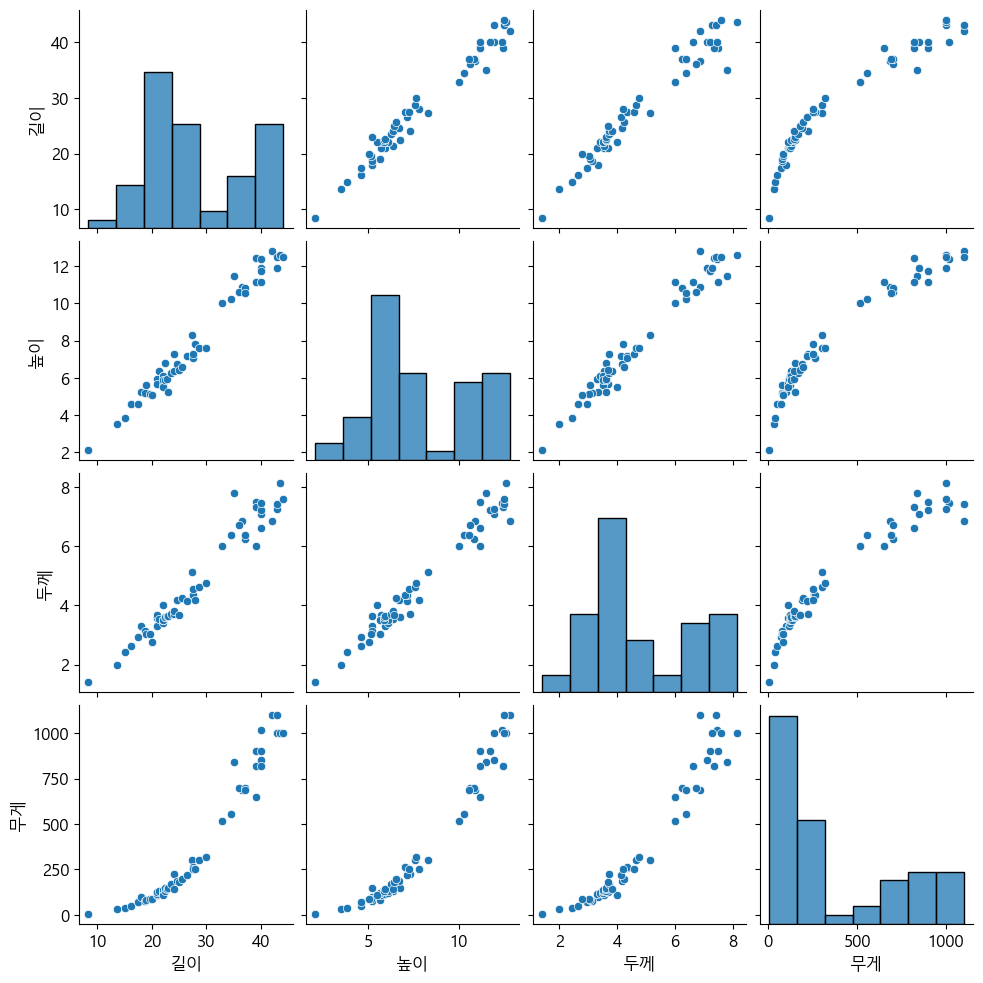

In [5]:
sns.pairplot(df)
plt.show()
plt.close()

- 독립변수 - 종속변수 간에는 상관관계가 존재하나 선형적인 상관관계는 아님
  - 다항선형회귀가 더 적합
- 독립변수끼리 선형적인 상관관계가 있음 (자기상관)
  - 다중공선성의 우려가 있어서 모델의 신뢰성이 떨어질 것임
  - 따라서 회귀에 적합한 데이터는 아님

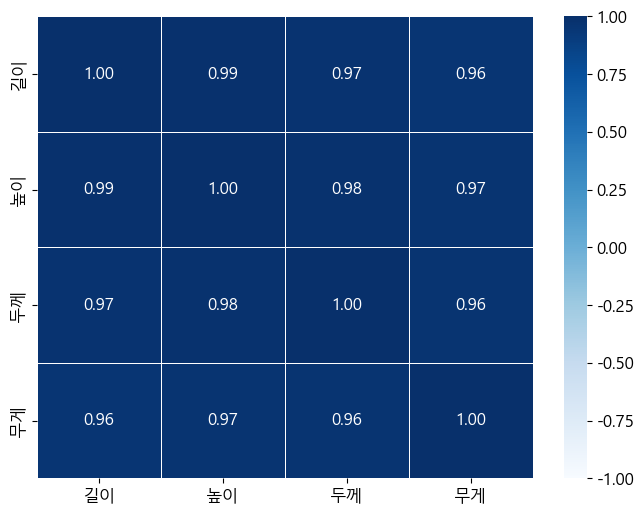

In [6]:
plt.figure()
sns.heatmap(df.corr(), annot = True, cmap = 'Blues', vmin = -1, vmax = 1, fmt = '.2f', linewidths=.5)
plt.show()

In [7]:
x = df[['길이', '높이', '두께']]
y = df['무게']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((39, 3), (17, 3), (39,), (17,))

In [8]:
yname = '무게'
xnames = x_train.columns
size = len(xnames)

model = LinearRegression()
fit = model.fit(x_train, y_train)
fit

LinearRegression()

In [9]:
print(fit.intercept_)
print(fit.coef_)
print(xnames)

-551.6168023909881
[-0.11665449 84.52536174 60.034447  ]
Index(['길이', '높이', '두께'], dtype='object')


In [10]:
# 회귀식
expr = "{yname} = ".format(yname = yname)

for i, v in enumerate(xnames):
    expr += "%0.3f * %s + " % (fit.coef_[i], v)
expr += "%0.3f" % fit.intercept_

expr

'무게 = -0.117 * 길이 + 84.525 * 높이 + 60.034 * 두께 + -551.617'

In [11]:
y_train_pred = fit.predict(x_train)
y_test_pred = fit.predict(x_test)

In [12]:
result = {
    "결정계수(R2)": r2_score(y_test, y_test_pred),
    "평균절대오차(MAE)": mean_absolute_error(y_test, y_test_pred),
    "평균제곱오차(MSE)": mean_squared_error(y_test, y_test_pred),
    "평균오차(RMSE)": np.sqrt(mean_squared_error(y_test, y_test_pred)),
    "평균 절대 백분오차 비율(MAPE)": np.mean(np.abs((y_test - y_test_pred) / y_test) * 100),
    "평균 비율 오차(MPE)": np.mean((y_test - y_test_pred) / y_test_pred * 100)
}

+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+
|              |   결정계수(R2) |   평균절대오차(MAE) |   평균제곱오차(MSE) |   평균오차(RMSE) |   평균 절대 백분오차 비율(MAPE) |   평균 비율 오차(MPE) |
|--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------|
| 선형회귀분석 |       0.910954 |             76.6279 |             7357.52 |           85.776 |                         44.1894 |               12.0991 |
+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+



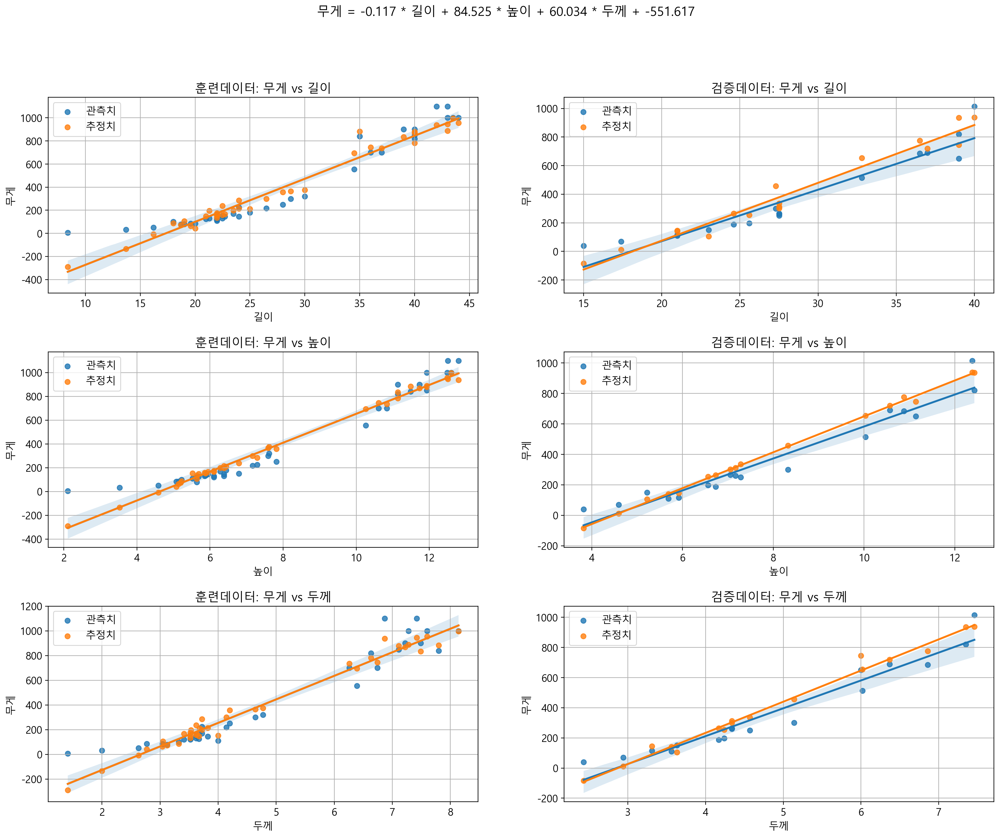

In [13]:
result_df = pd.DataFrame(result, index = ['선형회귀분석'])
print(tabulate(result_df, headers = 'keys', tablefmt = 'psql', showindex = True), end = "\n\n")

# 시각화
fig, ax = plt.subplots(len(xnames), 2, figsize=(20, 5*size), dpi=200)
fig.subplots_adjust(hspace=0.3)
fig.suptitle(expr, fontsize=15)

for i, v in enumerate(xnames):
    sns.regplot(x=x_train[v], y=y_train, ci=95, ax=ax[i][0], label='관측치')
    sns.regplot(x=x_train[v], y=y_train_pred, ci=0, ax=ax[i][0], label='추정치')
    ax[i][0].set_title(f"훈련데이터: 무게 vs {v}")
    ax[i][0].legend()
    ax[i][0].grid(True)

    sns.regplot(x=x_test[v], y=y_test, ci=95, ax=ax[i][1], label='관측치')
    sns.regplot(x=x_test[v], y=y_test_pred, ci=0, ax=ax[i][1], label='추정치')
    ax[i][1].set_title(f"검증데이터: 무게 vs {v}")
    ax[i][1].legend()
    ax[i][1].grid(True)

plt.show()
plt.close()

In [14]:
# 절편과 계수 결합
params = np.append(fit.intercept_, fit.coef_)

# 검증용 독립변수에 상수항 추가
design_x = x_train.copy()
# 0번째 필드에 '상수'라는 이름의 컬럼을 추가하고 값은 1로 설정함
design_x.insert(0, '상수', 1)

dot = np.dot(design_x.T,design_x)
inv = np.linalg.inv(dot)
dia = inv.diagonal()

# 제곱오차
MSE = (sum((y_train-y_train_pred)**2)) / (len(design_x)-len(design_x.iloc[0]))

se_b = np.sqrt(MSE * dia)
ts_b = params / se_b

# 각 독립변수별 p-value
p_values = [2*(1-t.cdf(np.abs(i),(len(design_x)-len(design_x.iloc[0])))) for i in ts_b]

# VIF
vif = [variance_inflation_factor(design_x.values, i) for i in range(len(design_x.columns))]

# 표준화 계수
train_df = x_train.copy()
train_df[y_train.name] = y_train
scaler = StandardScaler()
std = scaler.fit_transform(train_df)
std_df = pd.DataFrame(std, columns=df.columns)
std_x = std_df[xnames]
std_y = std_df[yname]
std_model = LinearRegression()
std_fit = std_model.fit(std_x, std_y)
beta = std_fit.coef_

# 결과표 구성하기
result_df = pd.DataFrame({
    "종속변수": [yname] * len(xnames),
    "독립변수": xnames,
    "B(비표준화 계수)": np.round(params[1:], 4),
    "표준오차": np.round(se_b[1:], 4),
    "β(표준화 계수)": np.round(beta, 4),
    "t": np.round(ts_b[1:], 4),
    "유의확률": np.round(p_values[1:], 4),
    "VIF": vif[1:],
})

#result_df
print(tabulate(result_df, headers='keys', tablefmt='psql', showindex=True), end="\n\n")

resid = y_train - y_train_pred          # 잔차
dw = durbin_watson(resid)               # 더빈 왓슨 통계량
r2 = r2_score(y_train, y_train_pred)    # 결정계수(설명력)
rowcount = len(x_train)                 # 표본수
featurecount = len(x_train.columns)     # 독립변수의 수

# 보정된 결정계수
adj_r2 = 1 - (1 - r2) * (rowcount-1) / (rowcount-featurecount-1)

tpl = "𝑅^2(%.3f), Adj.𝑅^2(%.3f), Durbin-Watson(%.3f)"
print(tpl % (r2, adj_r2, dw))

+----+------------+------------+--------------------+------------+------------------+---------+------------+---------+
|    | 종속변수   | 독립변수   |   B(비표준화 계수) |   표준오차 |   β(표준화 계수) |       t |   유의확률 |     VIF |
|----+------------+------------+--------------------+------------+------------------+---------+------------+---------|
|  0 | 무게       | 길이       |            -0.1167 |    10.0942 |          -0.003  | -0.0116 |     0.9908 | 45.3197 |
|  1 | 무게       | 높이       |            84.5254 |    38.7978 |           0.6761 |  2.1786 |     0.0362 | 64.3357 |
|  2 | 무게       | 두께       |            60.0344 |    41.5079 |           0.3039 |  1.4463 |     0.157  | 29.4988 |
+----+------------+------------+--------------------+------------+------------------+---------+------------+---------+

𝑅^2(0.948), Adj.𝑅^2(0.943), Durbin-Watson(1.855)


In [15]:
from statsmodels.formula.api import ols
ols("무게 ~ 길이+높이+두께",data = train_df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     무게   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.943
Method:                 Least Squares   F-statistic:                     211.0
Date:                Thu, 08 Feb 2024   Prob (F-statistic):           1.82e-22
Time:                        13:42:35   Log-Likelihood:                -228.09
No. Observations:                  39   AIC:                             464.2
Df Residuals:                      35   BIC:                             470.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -551.6168     50.212    -10.986      0.000    -653.552    -449.682
길이            -0.1167     10.094     -0.012      0.991     -20.609      20.376
높이            84.5254     38.798      2.179      0.036       5.762     163.289
두께            60.0344     41.508      1.446      0.157     -24.231     144.300
==============================================================================
Omnibus:                       18.305   Durbin-Watson:                   1.855
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               23.535
Skew:                           1.448   Prob(JB):                     7.75e-06
Kurtosis:                       5.469   Cond. No.                         115.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [16]:
y2 = y ** (1/3)

In [17]:
x_train2, x_test2, y_train2, y_test2 = train_test_split(x, y2, test_size = 0.3, random_state = 0)

In [18]:
model2 = LinearRegression()

In [19]:
fit2 = model2.fit(x_train2, y_train2)

In [20]:
print(fit2.intercept_)
print(fit2.coef_)
print(xnames)

0.1074282495709431
[0.08393414 0.39183328 0.21675686]
Index(['길이', '높이', '두께'], dtype='object')


In [21]:
# 회귀식
expr = "{yname} = ".format(yname = yname)

for i, v in enumerate(xnames):
    expr += "%0.3f * %s + " % (fit2.coef_[i], v)
expr += "%0.3f" % fit2.intercept_

expr

'무게 = 0.084 * 길이 + 0.392 * 높이 + 0.217 * 두께 + 0.107'

In [22]:
y_train_pred2 = fit2.predict(x_train2)
y_train_pred2_scaled = y_train_pred2 ** 3
y_test_pred2 = fit2.predict(x_test2)
y_test_pred2_scaled = y_test_pred2 ** 3

In [23]:
result2 = {
    "결정계수(R2)": r2_score(y_test, y_test_pred2_scaled),
    "평균절대오차(MAE)": mean_absolute_error(y_test, y_test_pred2_scaled),
    "평균제곱오차(MSE)": mean_squared_error(y_test, y_test_pred2_scaled),
    "평균오차(RMSE)": np.sqrt(mean_squared_error(y_test, y_test_pred2_scaled)),
    "평균 절대 백분오차 비율(MAPE)": np.mean(np.abs((y_test - y_test_pred2_scaled) / y_test) * 100),
    "평균 비율 오차(MPE)": np.mean((y_test - y_test_pred2_scaled) / y_test_pred2_scaled * 100)
}

+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+
|              |   결정계수(R2) |   평균절대오차(MAE) |   평균제곱오차(MSE) |   평균오차(RMSE) |   평균 절대 백분오차 비율(MAPE) |   평균 비율 오차(MPE) |
|--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------|
| 선형회귀분석 |       0.977063 |             27.0852 |              1895.2 |          43.5339 |                          7.0088 |               2.24117 |
+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+



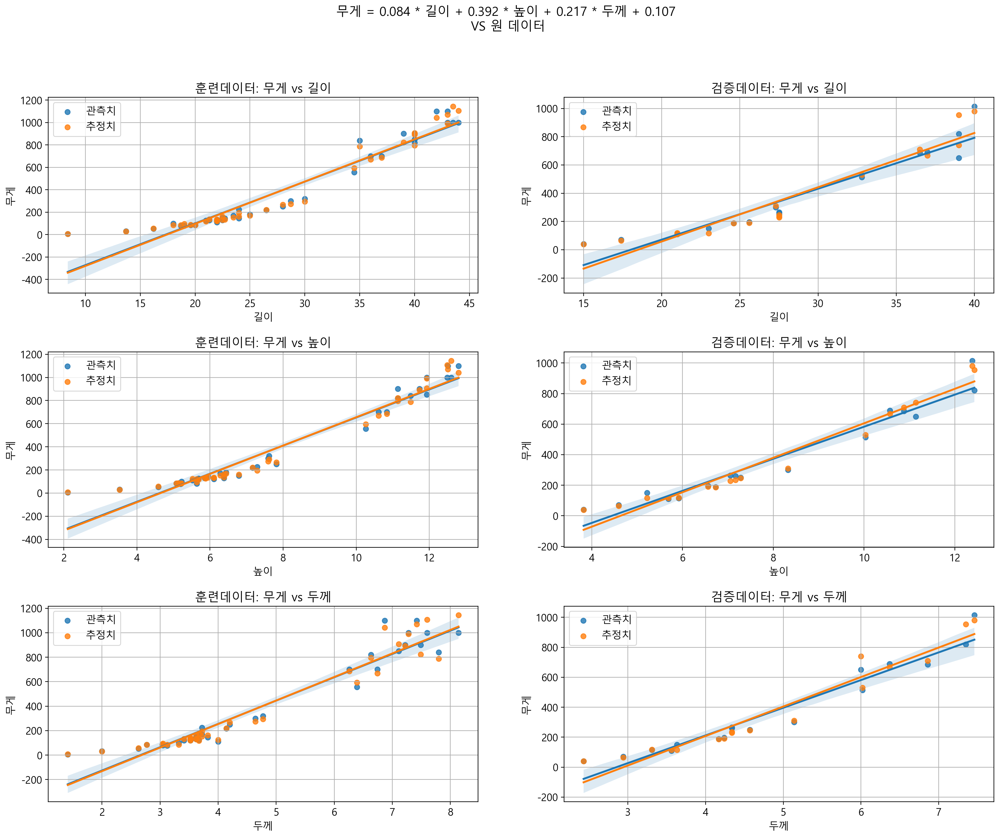

In [24]:
result_df = pd.DataFrame(result2, index = ['선형회귀분석'])
print(tabulate(result_df, headers = 'keys', tablefmt = 'psql', showindex = True), end = "\n\n")

# 시각화
fig, ax = plt.subplots(len(xnames), 2, figsize=(20, 5*size), dpi=200)
fig.subplots_adjust(hspace=0.3)
fig.suptitle(expr + "\n VS 원 데이터", fontsize=15)

for i, v in enumerate(xnames):
    sns.regplot(x=x_train2[v], y=y_train, ci=95, ax=ax[i][0], label='관측치')
    sns.regplot(x=x_train2[v], y=y_train_pred2_scaled, ci=0, ax=ax[i][0], label='추정치')
    ax[i][0].set_title(f"훈련데이터: 무게 vs {v}")
    ax[i][0].legend()
    ax[i][0].grid(True)

    sns.regplot(x=x_test2[v], y=y_test, ci=95, ax=ax[i][1], label='관측치')
    sns.regplot(x=x_test2[v], y=y_test_pred2_scaled, ci=0, ax=ax[i][1], label='추정치')
    ax[i][1].set_title(f"검증데이터: 무게 vs {v}")
    ax[i][1].legend()
    ax[i][1].grid(True)

plt.show()
plt.close()

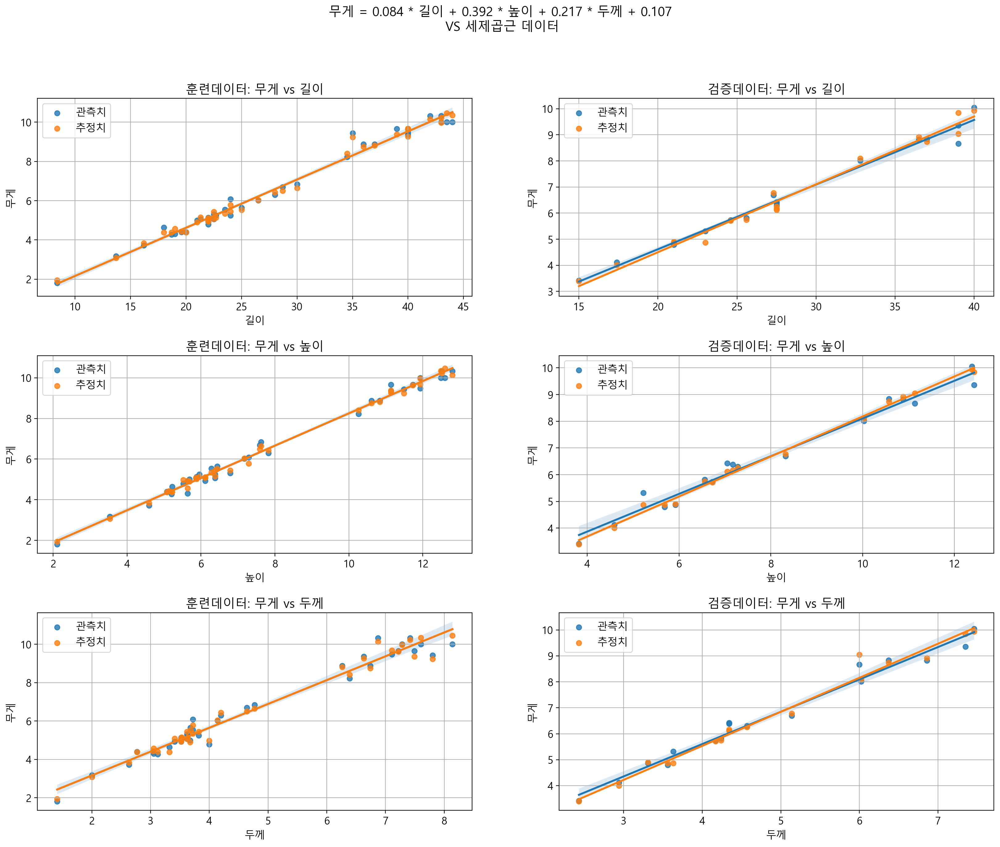

In [25]:
fig, ax = plt.subplots(len(xnames), 2, figsize=(20, 5*size), dpi=200)
fig.subplots_adjust(hspace=0.3)
fig.suptitle(expr+ "\n VS 세제곱근 데이터", fontsize=15)

for i, v in enumerate(xnames):
    sns.regplot(x=x_train2[v], y=y_train2, ci=95, ax=ax[i][0], label='관측치')
    sns.regplot(x=x_train2[v], y=y_train_pred2, ci=0, ax=ax[i][0], label='추정치')
    ax[i][0].set_title(f"훈련데이터: 무게 vs {v}")
    ax[i][0].legend()
    ax[i][0].grid(True)

    sns.regplot(x=x_test2[v], y=y_test2, ci=95, ax=ax[i][1], label='관측치')
    sns.regplot(x=x_test2[v], y=y_test_pred2, ci=0, ax=ax[i][1], label='추정치')
    ax[i][1].set_title(f"검증데이터: 무게 vs {v}")
    ax[i][1].legend()
    ax[i][1].grid(True)

plt.show()
plt.close()

In [27]:
from sklearn import datasets

In [54]:
df2 = pd.read_excel("./data/boston.xlsx")
df2.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV,CAT. MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0,0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6,0
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7,1
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4,1
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2,1


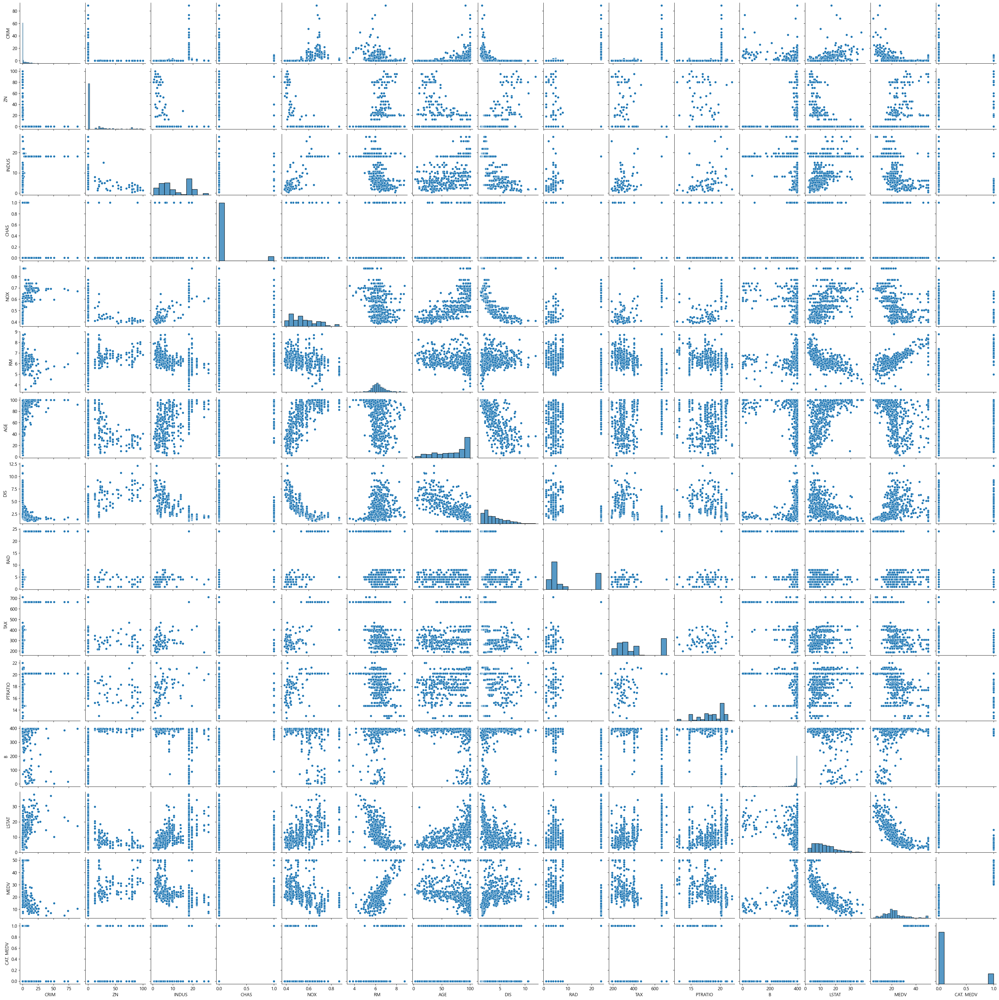

In [55]:
sns.pairplot(df2)
plt.show()
plt.close()

In [56]:
yname = "MEDV"

x = df2.copy()
y = x.pop(yname)

xnames = list(x.columns)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((354, 14), (152, 14), (354,), (152,))

MEDV = -0.126 * CRIM + -0.003 * ZN + 0.120 * INDUS + 2.143 * CHAS + -12.234 * NOX + 1.444 * RM + -0.023 * AGE + -0.805 * DIS + 0.186 * RAD + -0.009 * TAX + -0.589 * PTRATIO + 0.006 * B + -0.435 * LSTAT + 11.069 * CAT. MEDV + 38.002
+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+
|              |   결정계수(R2) |   평균절대오차(MAE) |   평균제곱오차(MSE) |   평균오차(RMSE) |   평균 절대 백분오차 비율(MAPE) |   평균 비율 오차(MPE) |
|--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------|
| 선형회귀분석 |       0.807363 |             2.85846 |               16.04 |            4.005 |                         14.5652 |               2.55123 |
+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+



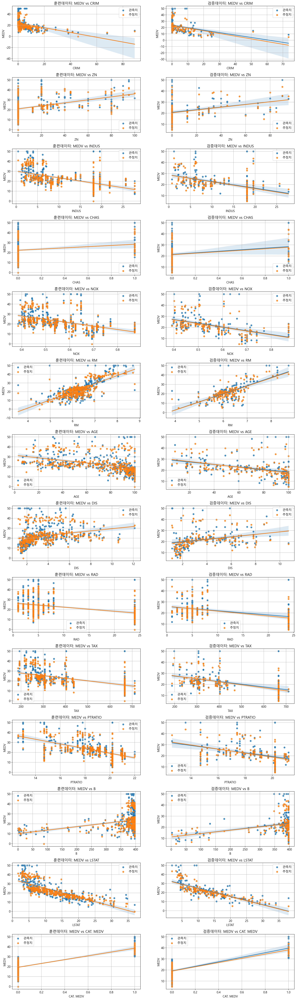

In [60]:
xnames = x_train.columns
size = len(xnames)

model = LinearRegression()
fit = model.fit(x_train, y_train)
fit
# 회귀식
expr = "{yname} = ".format(yname = yname)

for i, v in enumerate(xnames):
    expr += "%0.3f * %s + " % (fit.coef_[i], v)
expr += "%0.3f" % fit.intercept_

print(expr)

y_train_pred = fit.predict(x_train)
y_test_pred = fit.predict(x_test)
result = {
    "결정계수(R2)": r2_score(y_test, y_test_pred),
    "평균절대오차(MAE)": mean_absolute_error(y_test, y_test_pred),
    "평균제곱오차(MSE)": mean_squared_error(y_test, y_test_pred),
    "평균오차(RMSE)": np.sqrt(mean_squared_error(y_test, y_test_pred)),
    "평균 절대 백분오차 비율(MAPE)": np.mean(np.abs((y_test - y_test_pred) / y_test) * 100),
    "평균 비율 오차(MPE)": np.mean((y_test - y_test_pred) / y_test_pred * 100)
}
result_df = pd.DataFrame(result, index = ['선형회귀분석'])
print(tabulate(result_df, headers = 'keys', tablefmt = 'psql', showindex = True), end = "\n\n")

# 시각화
fig, ax = plt.subplots(len(xnames), 2, figsize=(20, 5*size), dpi=200)
fig.subplots_adjust(hspace=0.3)

for i, v in enumerate(xnames):
    sns.regplot(x=x_train[v], y=y_train, ci=95, ax=ax[i][0], label='관측치')
    sns.regplot(x=x_train[v], y=y_train_pred, ci=0, ax=ax[i][0], label='추정치')
    ax[i][0].set_title(f"훈련데이터: {yname} vs {v}")
    ax[i][0].legend()
    ax[i][0].grid(True)

    sns.regplot(x=x_test[v], y=y_test, ci=95, ax=ax[i][1], label='관측치')
    sns.regplot(x=x_test[v], y=y_test_pred, ci=0, ax=ax[i][1], label='추정치')
    ax[i][1].set_title(f"검증데이터: {yname} vs {v}")
    ax[i][1].legend()
    ax[i][1].grid(True)

plt.show()
plt.close()

In [75]:
x1 = df2.drop(['CHAS', 'CAT. MEDV', 'MEDV'], axis = 1).copy()
x2 = df2[['CHAS', 'CAT. MEDV']].copy()

x1.shape, x2.shape

((506, 12), (506, 2))

In [77]:
scaler = StandardScaler()
x1 = pd.DataFrame(scaler.fit_transform(x1), columns = x1.columns)
x1.head()

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,-0.419782,0.284830,-1.287909,-0.144217,0.413672,-0.120013,0.140214,-0.982843,-0.666608,-1.459000,0.441052,-1.075562
1,-0.417339,-0.487722,-0.593381,-0.740262,0.194274,0.367166,0.557160,-0.867883,-0.987329,-0.303094,0.441052,-0.492439
2,-0.417342,-0.487722,-0.593381,-0.740262,1.282714,-0.265812,0.557160,-0.867883,-0.987329,-0.303094,0.396427,-1.208727
3,-0.416750,-0.487722,-1.306878,-0.835284,1.016303,-0.809889,1.077737,-0.752922,-1.106115,0.113032,0.416163,-1.361517
4,-0.412482,-0.487722,-1.306878,-0.835284,1.228577,-0.511180,1.077737,-0.752922,-1.106115,0.113032,0.441052,-1.026501


In [80]:
x1_2 = pd.concat([x1, x2], axis = 1)

In [84]:
x_train, x_test, y_train, y_test = train_test_split(x1_2, y, test_size = 0.3, random_state = 0)

MEDV = -1.082 * CRIM + -0.068 * ZN + 0.824 * INDUS + -1.416 * NOX + 1.013 * RM + -0.634 * AGE + -1.694 * DIS + 1.617 * RAD + -1.561 * TAX + -1.273 * PTRATIO + 0.583 * B + -3.100 * LSTAT + 2.143 * CHAS + 11.069 * CAT. MEDV + 20.448
+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+
|              |   결정계수(R2) |   평균절대오차(MAE) |   평균제곱오차(MSE) |   평균오차(RMSE) |   평균 절대 백분오차 비율(MAPE) |   평균 비율 오차(MPE) |
|--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------|
| 선형회귀분석 |       0.807363 |             2.85846 |               16.04 |            4.005 |                         14.5652 |               2.55123 |
+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+



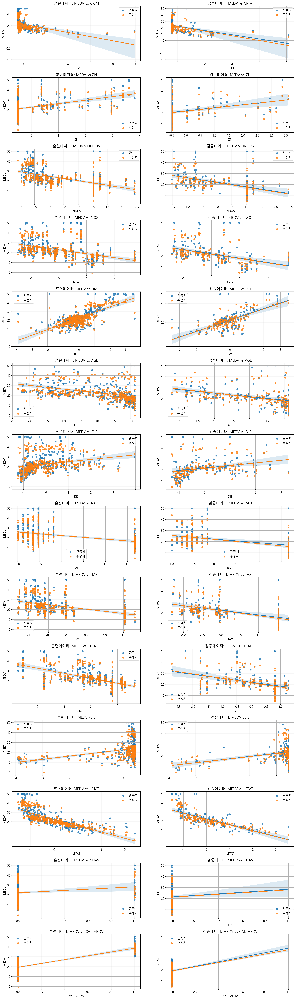

In [85]:
yname = "MEDV"

xnames = x_train.columns
size = len(xnames)

model = LinearRegression()
fit = model.fit(x_train, y_train)
fit
# 회귀식
expr = "{yname} = ".format(yname = yname)

for i, v in enumerate(xnames):
    expr += "%0.3f * %s + " % (fit.coef_[i], v)
expr += "%0.3f" % fit.intercept_

print(expr)

y_train_pred = fit.predict(x_train)
y_test_pred = fit.predict(x_test)
result = {
    "결정계수(R2)": r2_score(y_test, y_test_pred),
    "평균절대오차(MAE)": mean_absolute_error(y_test, y_test_pred),
    "평균제곱오차(MSE)": mean_squared_error(y_test, y_test_pred),
    "평균오차(RMSE)": np.sqrt(mean_squared_error(y_test, y_test_pred)),
    "평균 절대 백분오차 비율(MAPE)": np.mean(np.abs((y_test - y_test_pred) / y_test) * 100),
    "평균 비율 오차(MPE)": np.mean((y_test - y_test_pred) / y_test_pred * 100)
}
result_df = pd.DataFrame(result, index = ['선형회귀분석'])
print(tabulate(result_df, headers = 'keys', tablefmt = 'psql', showindex = True), end = "\n\n")

# 시각화
fig, ax = plt.subplots(len(xnames), 2, figsize=(20, 5*size), dpi=200)
fig.subplots_adjust(hspace=0.3)

for i, v in enumerate(xnames):
    sns.regplot(x=x_train[v], y=y_train, ci=95, ax=ax[i][0], label='관측치')
    sns.regplot(x=x_train[v], y=y_train_pred, ci=0, ax=ax[i][0], label='추정치')
    ax[i][0].set_title(f"훈련데이터: {yname} vs {v}")
    ax[i][0].legend()
    ax[i][0].grid(True)

    sns.regplot(x=x_test[v], y=y_test, ci=95, ax=ax[i][1], label='관측치')
    sns.regplot(x=x_test[v], y=y_test_pred, ci=0, ax=ax[i][1], label='추정치')
    ax[i][1].set_title(f"검증데이터: {yname} vs {v}")
    ax[i][1].legend()
    ax[i][1].grid(True)

plt.show()
plt.close()

In [87]:
# 절편과 계수 결합
params = np.append(fit.intercept_, fit.coef_)

# 검증용 독립변수에 상수항 추가
design_x = x_train.copy()
# 0번째 필드에 '상수'라는 이름의 컬럼을 추가하고 값은 1로 설정함
design_x.insert(0, '상수', 1)

dot = np.dot(design_x.T,design_x)
inv = np.linalg.inv(dot)
dia = inv.diagonal()

# 제곱오차
MSE = (sum((y_train-y_train_pred)**2)) / (len(design_x)-len(design_x.iloc[0]))

se_b = np.sqrt(MSE * dia)
ts_b = params / se_b

# 각 독립변수별 p-value
p_values = [2*(1-t.cdf(np.abs(i),(len(design_x)-len(design_x.iloc[0])))) for i in ts_b]

# VIF
vif = [variance_inflation_factor(design_x.values, i) for i in range(len(design_x.columns))]

# 표준화 계수
train_df = x_train.copy()
train_df[y_train.name] = y_train
scaler = StandardScaler()
std = scaler.fit_transform(train_df)
std_df = pd.DataFrame(std, columns=df2.columns)
std_x = std_df[xnames]
std_y = std_df[yname]
std_model = LinearRegression()
std_fit = std_model.fit(std_x, std_y)
beta = std_fit.coef_

# 결과표 구성하기
result_df = pd.DataFrame({
    "종속변수": [yname] * len(xnames),
    "독립변수": xnames,
    "B(비표준화 계수)": np.round(params[1:], 4),
    "표준오차": np.round(se_b[1:], 4),
    "β(표준화 계수)": np.round(beta, 4),
    "t": np.round(ts_b[1:], 4),
    "유의확률": np.round(p_values[1:], 4),
    "VIF": vif[1:],
})

#result_df
print(tabulate(result_df, headers='keys', tablefmt='psql', showindex=True), end="\n\n")

resid = y_train - y_train_pred          # 잔차
dw = durbin_watson(resid)               # 더빈 왓슨 통계량
r2 = r2_score(y_train, y_train_pred)    # 결정계수(설명력)
rowcount = len(x_train)                 # 표본수
featurecount = len(x_train.columns)     # 독립변수의 수

# 보정된 결정계수
adj_r2 = 1 - (1 - r2) * (rowcount-1) / (rowcount-featurecount-1)

tpl = "𝑅^2(%.3f), Adj.𝑅^2(%.3f), Durbin-Watson(%.3f)"
print(tpl % (r2, adj_r2, dw))

+----+------------+------------+--------------------+------------+------------------+---------+------------+---------+
|    | 종속변수   | 독립변수   |   B(비표준화 계수) |   표준오차 |   β(표준화 계수) |       t |   유의확률 |     VIF |
|----+------------+------------+--------------------+------------+------------------+---------+------------+---------|
|  0 | MEDV       | CRIM       |            -1.082  |     0.2541 |           0.1044 | -4.2575 |     0      | 1.71933 |
|  1 | MEDV       | ZN         |            -0.068  |     0.2932 |           0.1654 | -0.2318 |     0.8169 | 2.49657 |
|  2 | MEDV       | INDUS      |             0.8244 |     0.3675 |          -0.1872 |  2.2433 |     0.0255 | 3.96189 |
|  3 | MEDV       | NOX        |            -1.4163 |     0.4045 |           0.1451 | -3.5015 |     0.0005 | 4.59626 |
|  4 | MEDV       | RM         |             1.0134 |     0.2903 |           0.1095 |  3.491  |     0.0005 | 2.37481 |
|  5 | MEDV       | AGE        |            -0.6342 |     0.345  |         

In [89]:
x1 = df2.drop(['CHAS', 'CAT. MEDV', 'MEDV', 'ZN', 'INDUS', 'AGE', 'TAX', 'B'], axis = 1).copy()
x2 = df2[['CHAS', 'CAT. MEDV']].copy()

x1.shape, x2.shape

((506, 7), (506, 2))

In [90]:
scaler = StandardScaler()
x1 = pd.DataFrame(scaler.fit_transform(x1), columns = x1.columns)
x1.head()

,CRIM,NOX,RM,DIS,RAD,PTRATIO,LSTAT
0,-0.419782,-0.144217,0.413672,0.140214,-0.982843,-1.459000,-1.075562
1,-0.417339,-0.740262,0.194274,0.557160,-0.867883,-0.303094,-0.492439
2,-0.417342,-0.740262,1.282714,0.557160,-0.867883,-0.303094,-1.208727
3,-0.416750,-0.835284,1.016303,1.077737,-0.752922,0.113032,-1.361517
4,-0.412482,-0.835284,1.228577,1.077737,-0.752922,0.113032,-1.026501


In [91]:
x1_2 = pd.concat([x1, x2], axis = 1)

In [92]:
x_train, x_test, y_train, y_test = train_test_split(x1_2, y, test_size = 0.3, random_state = 0)

MEDV = -1.086 * CRIM + -1.641 * NOX + 0.915 * RM + -1.744 * DIS + 0.391 * RAD + -1.240 * PTRATIO + -3.426 * LSTAT + 2.534 * CHAS + 10.852 * CAT. MEDV + 20.496
+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+
|              |   결정계수(R2) |   평균절대오차(MAE) |   평균제곱오차(MSE) |   평균오차(RMSE) |   평균 절대 백분오차 비율(MAPE) |   평균 비율 오차(MPE) |
|--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------|
| 선형회귀분석 |       0.801534 |             2.93827 |             16.5254 |          4.06514 |                          15.014 |               2.08315 |
+--------------+----------------+---------------------+---------------------+------------------+---------------------------------+-----------------------+



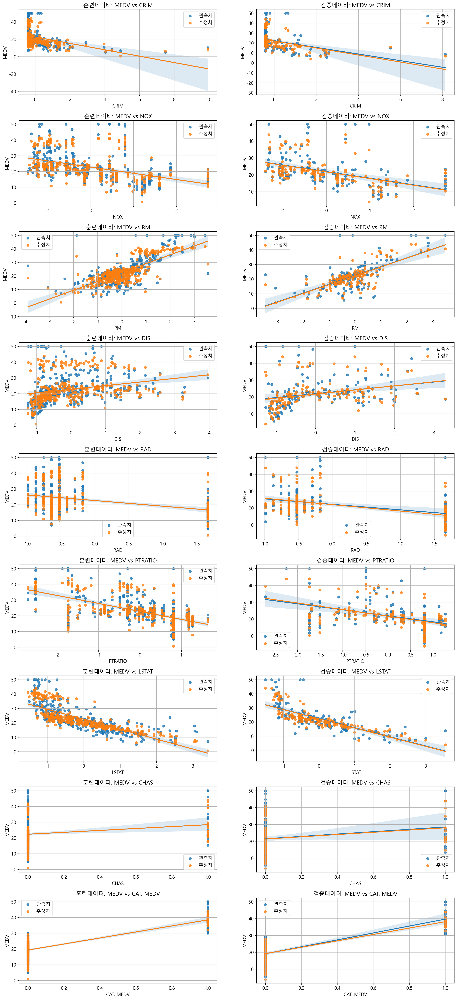

In [94]:
yname = "MEDV"

xnames = x_train.columns
size = len(xnames)

model = LinearRegression()
fit = model.fit(x_train, y_train)
fit
# 회귀식
expr = "{yname} = ".format(yname = yname)

for i, v in enumerate(xnames):
    expr += "%0.3f * %s + " % (fit.coef_[i], v)
expr += "%0.3f" % fit.intercept_

print(expr)

y_train_pred = fit.predict(x_train)
y_test_pred = fit.predict(x_test)
result = {
    "결정계수(R2)": r2_score(y_test, y_test_pred),
    "평균절대오차(MAE)": mean_absolute_error(y_test, y_test_pred),
    "평균제곱오차(MSE)": mean_squared_error(y_test, y_test_pred),
    "평균오차(RMSE)": np.sqrt(mean_squared_error(y_test, y_test_pred)),
    "평균 절대 백분오차 비율(MAPE)": np.mean(np.abs((y_test - y_test_pred) / y_test) * 100),
    "평균 비율 오차(MPE)": np.mean((y_test - y_test_pred) / y_test_pred * 100)
}
result_df = pd.DataFrame(result, index = ['선형회귀분석'])
print(tabulate(result_df, headers = 'keys', tablefmt = 'psql', showindex = True), end = "\n\n")

# 시각화
fig, ax = plt.subplots(len(xnames), 2, figsize=(20, 5*size), dpi=200)
fig.subplots_adjust(hspace=0.3)

for i, v in enumerate(xnames):
    sns.regplot(x=x_train[v], y=y_train, ci=95, ax=ax[i][0], label='관측치')
    sns.regplot(x=x_train[v], y=y_train_pred, ci=0, ax=ax[i][0], label='추정치')
    ax[i][0].set_title(f"훈련데이터: {yname} vs {v}")
    ax[i][0].legend()
    ax[i][0].grid(True)

    sns.regplot(x=x_test[v], y=y_test, ci=95, ax=ax[i][1], label='관측치')
    sns.regplot(x=x_test[v], y=y_test_pred, ci=0, ax=ax[i][1], label='추정치')
    ax[i][1].set_title(f"검증데이터: {yname} vs {v}")
    ax[i][1].legend()
    ax[i][1].grid(True)

plt.show()
plt.close()

In [109]:
cols = list(x1_2.columns)
cols.append(yname)

# 절편과 계수 결합
params = np.append(fit.intercept_, fit.coef_)

# 검증용 독립변수에 상수항 추가
design_x = x_train.copy()
# 0번째 필드에 '상수'라는 이름의 컬럼을 추가하고 값은 1로 설정함
design_x.insert(0, '상수', 1)

dot = np.dot(design_x.T,design_x)
inv = np.linalg.inv(dot)
dia = inv.diagonal()

# 제곱오차
MSE = (sum((y_train-y_train_pred)**2)) / (len(design_x)-len(design_x.iloc[0]))

se_b = np.sqrt(MSE * dia)
ts_b = params / se_b

# 각 독립변수별 p-value
p_values = [2*(1-t.cdf(np.abs(i),(len(design_x)-len(design_x.iloc[0])))) for i in ts_b]

# VIF
vif = [variance_inflation_factor(design_x.values, i) for i in range(len(design_x.columns))]

# 표준화 계수
train_df = x_train.copy()
train_df[y_train.name] = y_train
scaler = StandardScaler()
std = scaler.fit_transform(train_df)
std_df = pd.DataFrame(std, columns=train_df.columns)
std_x = std_df[xnames]
std_y = std_df[yname]
std_model = LinearRegression()
std_fit = std_model.fit(std_x, std_y)
beta = std_fit.coef_

# 결과표 구성하기
result_df = pd.DataFrame({
    "종속변수": [yname] * len(xnames),
    "독립변수": xnames,
    "B(비표준화 계수)": np.round(params[1:], 4),
    "표준오차": np.round(se_b[1:], 4),
    "β(표준화 계수)": np.round(beta, 4),
    "t": np.round(ts_b[1:], 4),
    "유의확률": np.round(p_values[1:], 4),
    "VIF": vif[1:],
})

#result_df
print(tabulate(result_df, headers='keys', tablefmt='psql', showindex=True), end="\n\n")

resid = y_train - y_train_pred          # 잔차
dw = durbin_watson(resid)               # 더빈 왓슨 통계량
r2 = r2_score(y_train, y_train_pred)    # 결정계수(설명력)
rowcount = len(x_train)                 # 표본수
featurecount = len(x_train.columns)     # 독립변수의 수

# 보정된 결정계수
adj_r2 = 1 - (1 - r2) * (rowcount-1) / (rowcount-featurecount-1)

tpl = "𝑅^2(%.3f), Adj.𝑅^2(%.3f), Durbin-Watson(%.3f)"
print(tpl % (r2, adj_r2, dw))

+----+------------+------------+--------------------+------------+------------------+----------+------------+---------+
|    | 종속변수   | 독립변수   |   B(비표준화 계수) |   표준오차 |   β(표준화 계수) |        t |   유의확률 |     VIF |
|----+------------+------------+--------------------+------------+------------------+----------+------------+---------|
|  0 | MEDV       | CRIM       |            -1.086  |     0.2582 |          -0.1145 |  -4.2068 |     0      | 1.70433 |
|  1 | MEDV       | NOX        |            -1.6405 |     0.3697 |          -0.1777 |  -4.4377 |     0      | 3.68819 |
|  2 | MEDV       | RM         |             0.915  |     0.291  |           0.0993 |   3.144  |     0.0018 | 2.29293 |
|  3 | MEDV       | DIS        |            -1.7436 |     0.3163 |          -0.1859 |  -5.5129 |     0      | 2.61559 |
|  4 | MEDV       | RAD        |             0.3913 |     0.3142 |           0.0423 |   1.2453 |     0.2139 | 2.65612 |
|  5 | MEDV       | PTRATIO    |            -1.2398 |     0.2483 | 

In [110]:
import transformers